In [1]:
import geopandas as gpd
import esda
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

from libpysal import graph

In [9]:
gdf = gpd.read_parquet('/data/processed_data/rent_2022.parquet')

For Freiburg only

In [10]:
gdf = gdf.cx[4150000:4170000,2760000:2780000]

In [11]:
gdf

,x_mp_100m,y_mp_100m,durchschnMieteQM,werterlaeuternde_Zeichen,geometry
GITTER_ID_100m,,,,,
CRS3035RES100mN2759900E4157100,4157150,2759950,9.60,None,"POLYGON ((4157200 2760000, 4157200 2759900, 41..."
CRS3035RES100mN2759900E4157200,4157250,2759950,8.70,None,"POLYGON ((4157300 2760000, 4157300 2759900, 41..."
CRS3035RES100mN2759900E4157300,4157350,2759950,8.69,None,"POLYGON ((4157400 2760000, 4157400 2759900, 41..."
CRS3035RES100mN2759900E4157400,4157450,2759950,9.56,None,"POLYGON ((4157500 2760000, 4157500 2759900, 41..."
CRS3035RES100mN2759900E4157500,4157550,2759950,5.55,None,"POLYGON ((4157600 2760000, 4157600 2759900, 41..."
...,...,...,...,...,...
CRS3035RES100mN2780000E4161400,4161450,2780050,8.20,None,"POLYGON ((4161500 2780100, 4161500 2780000, 41..."
CRS3035RES100mN2780000E4161500,4161550,2780050,7.84,None,"POLYGON ((4161600 2780100, 4161600 2780000, 41..."
CRS3035RES100mN2780000E4161600,4161650,2780050,9.58,None,"POLYGON ((4161700 2780100, 4161700 2780000, 41..."


remove nan values to calculate Moran's I

In [12]:
not_nan = ~np.isnan(gdf['durchschnMieteQM'])

In [13]:
not_nan

GITTER_ID_100m
CRS3035RES100mN2759900E4157100    True
CRS3035RES100mN2759900E4157200    True
CRS3035RES100mN2759900E4157300    True
CRS3035RES100mN2759900E4157400    True
CRS3035RES100mN2759900E4157500    True
                                  ... 
CRS3035RES100mN2780000E4161400    True
CRS3035RES100mN2780000E4161500    True
CRS3035RES100mN2780000E4161600    True
CRS3035RES100mN2780000E4161800    True
CRS3035RES100mN2780000E4163200    True
Name: durchschnMieteQM, Length: 5034, dtype: bool

In [14]:
gdf = gdf[not_nan]

In [15]:
gdf

,x_mp_100m,y_mp_100m,durchschnMieteQM,werterlaeuternde_Zeichen,geometry
GITTER_ID_100m,,,,,
CRS3035RES100mN2759900E4157100,4157150,2759950,9.60,None,"POLYGON ((4157200 2760000, 4157200 2759900, 41..."
CRS3035RES100mN2759900E4157200,4157250,2759950,8.70,None,"POLYGON ((4157300 2760000, 4157300 2759900, 41..."
CRS3035RES100mN2759900E4157300,4157350,2759950,8.69,None,"POLYGON ((4157400 2760000, 4157400 2759900, 41..."
CRS3035RES100mN2759900E4157400,4157450,2759950,9.56,None,"POLYGON ((4157500 2760000, 4157500 2759900, 41..."
CRS3035RES100mN2759900E4157500,4157550,2759950,5.55,None,"POLYGON ((4157600 2760000, 4157600 2759900, 41..."
...,...,...,...,...,...
CRS3035RES100mN2780000E4161400,4161450,2780050,8.20,None,"POLYGON ((4161500 2780100, 4161500 2780000, 41..."
CRS3035RES100mN2780000E4161500,4161550,2780050,7.84,None,"POLYGON ((4161600 2780100, 4161600 2780000, 41..."
CRS3035RES100mN2780000E4161600,4161650,2780050,9.58,None,"POLYGON ((4161700 2780100, 4161700 2780000, 41..."


In [ ]:
gdf.explore(
    "durchschnMieteQM",
    cmap="coolwarm",
    prefer_canvas=True,
    tiles="CartoDB Positron",
)

<Axes: >

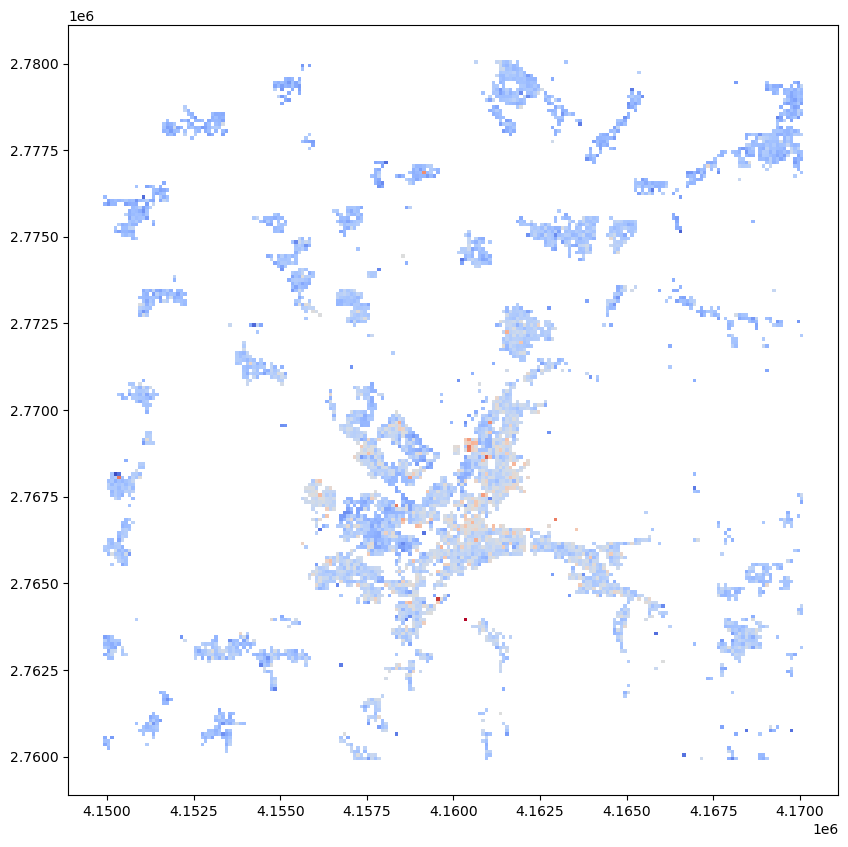

In [19]:
f, ax = plt.subplots(1, figsize=(10, 10))
gdf.plot(ax=ax, column = "durchschnMieteQM",cmap="coolwarm")

In [20]:
contiguity = graph.Graph.build_contiguity(gdf, rook=False)

In [21]:
contiguity

<Graph of 5034 nodes and 27750 nonzero edges indexed by
 ['CRS3035RES100mN2759900E4157100', 'CRS3035RES100mN2759900E4157200', 'CRS3035RES100mN2759900E4157300', 'CRS3035RES100mN2759900E4157400', 'CRS3035RES100mN2759900E4157500', ...]>

In [23]:
contiguity_r = contiguity.transform("r")

In [24]:
gdf['lag'] = contiguity_r.lag(gdf["durchschnMieteQM"])
gdf.head()

,x_mp_100m,y_mp_100m,durchschnMieteQM,werterlaeuternde_Zeichen,geometry,lag
GITTER_ID_100m,,,,,,
CRS3035RES100mN2759900E4157100,4157150,2759950,9.60,None,"POLYGON ((4157200 2760000, 4157200 2759900, 41...",9.930
CRS3035RES100mN2759900E4157200,4157250,2759950,8.70,None,"POLYGON ((4157300 2760000, 4157300 2759900, 41...",9.726
CRS3035RES100mN2759900E4157300,4157350,2759950,8.69,None,"POLYGON ((4157400 2760000, 4157400 2759900, 41...",9.855
CRS3035RES100mN2759900E4157400,4157450,2759950,9.56,None,"POLYGON ((4157500 2760000, 4157500 2759900, 41...",8.180
CRS3035RES100mN2759900E4157500,4157550,2759950,5.55,None,"POLYGON ((4157600 2760000, 4157600 2759900, 41...",9.895


In [25]:
gdf["rent_std"] = (
    gdf["durchschnMieteQM"] - gdf["durchschnMieteQM"].mean()
) / gdf["durchschnMieteQM"].std()

In [26]:
gdf

,x_mp_100m,y_mp_100m,durchschnMieteQM,werterlaeuternde_Zeichen,geometry,lag,rent_std
GITTER_ID_100m,,,,,,,
CRS3035RES100mN2759900E4157100,4157150,2759950,9.60,None,"POLYGON ((4157200 2760000, 4157200 2759900, 41...",9.9300,0.345884
CRS3035RES100mN2759900E4157200,4157250,2759950,8.70,None,"POLYGON ((4157300 2760000, 4157300 2759900, 41...",9.7260,-0.108608
CRS3035RES100mN2759900E4157300,4157350,2759950,8.69,None,"POLYGON ((4157400 2760000, 4157400 2759900, 41...",9.8550,-0.113658
CRS3035RES100mN2759900E4157400,4157450,2759950,9.56,None,"POLYGON ((4157500 2760000, 4157500 2759900, 41...",8.1800,0.325685
CRS3035RES100mN2759900E4157500,4157550,2759950,5.55,None,"POLYGON ((4157600 2760000, 4157600 2759900, 41...",9.8950,-1.699332
...,...,...,...,...,...,...,...
CRS3035RES100mN2780000E4161400,4161450,2780050,8.20,None,"POLYGON ((4161500 2780100, 4161500 2780000, 41...",8.8420,-0.361104
CRS3035RES100mN2780000E4161500,4161550,2780050,7.84,None,"POLYGON ((4161600 2780100, 4161600 2780000, 41...",8.2760,-0.542901
CRS3035RES100mN2780000E4161600,4161650,2780050,9.58,None,"POLYGON ((4161700 2780100, 4161700 2780000, 41...",7.7475,0.335784


In [27]:
gdf["rent_std_lag"] = contiguity_r.lag(gdf["rent_std"])

In [28]:
gdf

,x_mp_100m,y_mp_100m,durchschnMieteQM,werterlaeuternde_Zeichen,geometry,lag,rent_std,rent_std_lag
GITTER_ID_100m,,,,,,,,
CRS3035RES100mN2759900E4157100,4157150,2759950,9.60,None,"POLYGON ((4157200 2760000, 4157200 2759900, 41...",9.9300,0.345884,0.512531
CRS3035RES100mN2759900E4157200,4157250,2759950,8.70,None,"POLYGON ((4157300 2760000, 4157300 2759900, 41...",9.7260,-0.108608,0.409513
CRS3035RES100mN2759900E4157300,4157350,2759950,8.69,None,"POLYGON ((4157400 2760000, 4157400 2759900, 41...",9.8550,-0.113658,0.474657
CRS3035RES100mN2759900E4157400,4157450,2759950,9.56,None,"POLYGON ((4157500 2760000, 4157500 2759900, 41...",8.1800,0.325685,-0.371204
CRS3035RES100mN2759900E4157500,4157550,2759950,5.55,None,"POLYGON ((4157600 2760000, 4157600 2759900, 41...",9.8950,-1.699332,0.494857
...,...,...,...,...,...,...,...,...
CRS3035RES100mN2780000E4161400,4161450,2780050,8.20,None,"POLYGON ((4161500 2780100, 4161500 2780000, 41...",8.8420,-0.361104,-0.036900
CRS3035RES100mN2780000E4161500,4161550,2780050,7.84,None,"POLYGON ((4161600 2780100, 4161600 2780000, 41...",8.2760,-0.542901,-0.322725
CRS3035RES100mN2780000E4161600,4161650,2780050,9.58,None,"POLYGON ((4161700 2780100, 4161700 2780000, 41...",7.7475,0.335784,-0.589613


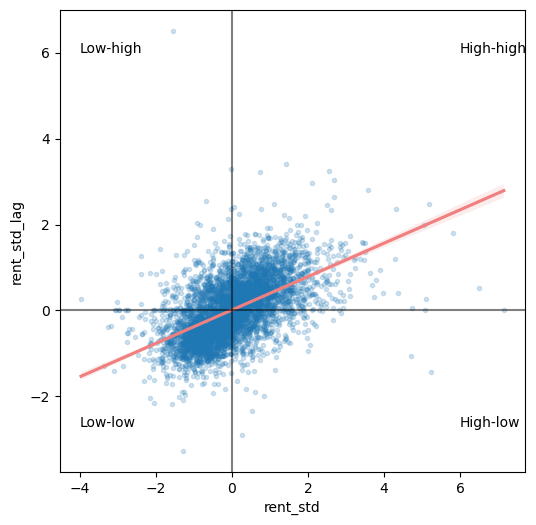

In [35]:
f, ax = plt.subplots(1, figsize=(6, 6))
sns.regplot(
    x="rent_std",
    y="rent_std_lag",
    data=gdf,
    marker=".",
    scatter_kws={"alpha": 0.2},
    line_kws=dict(color="lightcoral")
)
plt.axvline(0, c="black", alpha=0.5)
plt.axhline(0, c="black", alpha=0.5)
plt.text(6,6, "High-high", fontsize=10)
plt.text(6, -2.7, "High-low", fontsize=10)
plt.text(-4, 6, "Low-high", fontsize=10)
plt.text(-4, -2.7, "Low-low", fontsize=10);

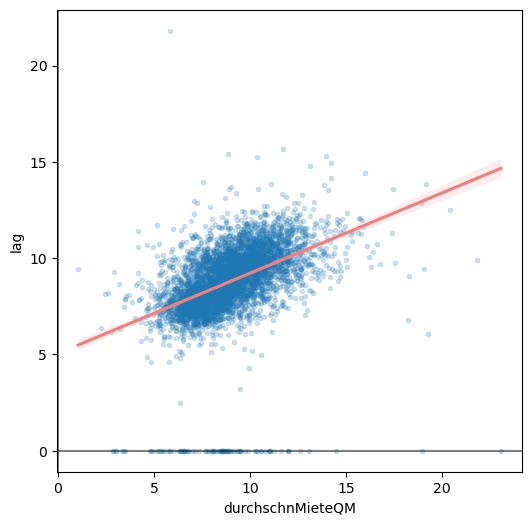

In [30]:
f, ax = plt.subplots(1, figsize=(6, 6))
sns.regplot(
    x="durchschnMieteQM",
    y="lag",
    data=gdf,
    marker=".",
    scatter_kws={"alpha": 0.2},
    line_kws=dict(color="lightcoral")
)
plt.axvline(0, c="black", alpha=0.5)
plt.axhline(0, c="black", alpha=0.5);

In [31]:
mi = esda.Moran(gdf['durchschnMieteQM'], contiguity_r.to_W())

('WARNING: ', 'CRS3035RES100mN2759900E4167100', ' is an island (no neighbors)')
('WARNING: ', 'CRS3035RES100mN2760000E4166600', ' is an island (no neighbors)')
('WARNING: ', 'CRS3035RES100mN2760300E4151100', ' is an island (no neighbors)')
('WARNING: ', 'CRS3035RES100mN2760600E4158300', ' is an island (no neighbors)')
('WARNING: ', 'CRS3035RES100mN2760600E4168100', ' is an island (no neighbors)')
('WARNING: ', 'CRS3035RES100mN2760600E4168800', ' is an island (no neighbors)')
('WARNING: ', 'CRS3035RES100mN2760700E4168400', ' is an island (no neighbors)')
('WARNING: ', 'CRS3035RES100mN2760700E4169700', ' is an island (no neighbors)')
('WARNING: ', 'CRS3035RES100mN2760800E4167700', ' is an island (no neighbors)')
('WARNING: ', 'CRS3035RES100mN2760900E4150800', ' is an island (no neighbors)')
('WARNING: ', 'CRS3035RES100mN2761000E4160800', ' is an island (no neighbors)')
('WARNING: ', 'CRS3035RES100mN2761200E4161300', ' is an island (no neighbors)')
('WARNING: ', 'CRS3035RES100mN2761800E41

/opt/conda/lib/python3.11/site-packages/libpysal/graph/base.py:267: UserWarning: The weights matrix is not fully connected: 
 There are 202 disconnected components.
 There are 98 islands with ids: CRS3035RES100mN2759900E4167100, CRS3035RES100mN2760000E4166600, CRS3035RES100mN2760300E4151100, CRS3035RES100mN2760600E4158300, CRS3035RES100mN2760600E4168100, CRS3035RES100mN2760600E4168800, CRS3035RES100mN2760700E4168400, CRS3035RES100mN2760700E4169700, CRS3035RES100mN2760800E4167700, CRS3035RES100mN2760900E4150800, CRS3035RES100mN2761000E4160800, CRS3035RES100mN2761200E4161300, CRS3035RES100mN2761800E4168000, CRS3035RES100mN2761900E4161400, CRS3035RES100mN2762000E4165000, CRS3035RES100mN2762200E4158000, CRS3035RES100mN2762400E4159000, CRS3035RES100mN2762500E4165800, CRS3035RES100mN2762600E4156700, CRS3035RES100mN2762700E4165000, CRS3035RES100mN2762700E4166000, CRS3035RES100mN2762900E4158300, CRS3035RES100mN2763100E4170000, CRS3035RES100mN2763200E4166900, CRS3035RES100mN2763400E4161600, CRS

In [32]:
mi.I

0.3959181762660139

In [33]:
print(f"Moran's I: {mi.I}, p-value: {mi.p_sim}")

Moran's I: 0.3959181762660139, p-value: 0.001


In [34]:
lisa = esda.Moran_Local(gdf['durchschnMieteQM'], contiguity_r.to_W())

/opt/conda/lib/python3.11/site-packages/libpysal/graph/base.py:267: UserWarning: The weights matrix is not fully connected: 
 There are 202 disconnected components.
 There are 98 islands with ids: CRS3035RES100mN2759900E4167100, CRS3035RES100mN2760000E4166600, CRS3035RES100mN2760300E4151100, CRS3035RES100mN2760600E4158300, CRS3035RES100mN2760600E4168100, CRS3035RES100mN2760600E4168800, CRS3035RES100mN2760700E4168400, CRS3035RES100mN2760700E4169700, CRS3035RES100mN2760800E4167700, CRS3035RES100mN2760900E4150800, CRS3035RES100mN2761000E4160800, CRS3035RES100mN2761200E4161300, CRS3035RES100mN2761800E4168000, CRS3035RES100mN2761900E4161400, CRS3035RES100mN2762000E4165000, CRS3035RES100mN2762200E4158000, CRS3035RES100mN2762400E4159000, CRS3035RES100mN2762500E4165800, CRS3035RES100mN2762600E4156700, CRS3035RES100mN2762700E4165000, CRS3035RES100mN2762700E4166000, CRS3035RES100mN2762900E4158300, CRS3035RES100mN2763100E4170000, CRS3035RES100mN2763200E4166900, CRS3035RES100mN2763400E4161600, CRS

('WARNING: ', 'CRS3035RES100mN2759900E4167100', ' is an island (no neighbors)')
('WARNING: ', 'CRS3035RES100mN2760000E4166600', ' is an island (no neighbors)')
('WARNING: ', 'CRS3035RES100mN2760300E4151100', ' is an island (no neighbors)')
('WARNING: ', 'CRS3035RES100mN2760600E4158300', ' is an island (no neighbors)')
('WARNING: ', 'CRS3035RES100mN2760600E4168100', ' is an island (no neighbors)')
('WARNING: ', 'CRS3035RES100mN2760600E4168800', ' is an island (no neighbors)')
('WARNING: ', 'CRS3035RES100mN2760700E4168400', ' is an island (no neighbors)')
('WARNING: ', 'CRS3035RES100mN2760700E4169700', ' is an island (no neighbors)')
('WARNING: ', 'CRS3035RES100mN2760800E4167700', ' is an island (no neighbors)')
('WARNING: ', 'CRS3035RES100mN2760900E4150800', ' is an island (no neighbors)')
('WARNING: ', 'CRS3035RES100mN2761000E4160800', ' is an island (no neighbors)')
('WARNING: ', 'CRS3035RES100mN2761200E4161300', ' is an island (no neighbors)')
('WARNING: ', 'CRS3035RES100mN2761800E41

/opt/conda/lib/python3.11/site-packages/esda/moran.py:1059: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim


# Local Spatial Autocorrelation

## 0.1 Significance

In [36]:
gdf_01 = gdf.copy()

In [37]:
gdf_01.loc[lisa.p_sim < 0.1, 'cluster'] = lisa.q[lisa.p_sim < 0.1]
gdf_01["cluster"] = gdf_01["cluster"].fillna(0)
gdf_01["cluster"] = gdf_01["cluster"].map(
    {
        0: "Not significant",
        1: "High-high",
        2: "Low-high",
        3: "Low-low",
        4: "High-low",
    }
)
gdf_01.head()

,x_mp_100m,y_mp_100m,durchschnMieteQM,werterlaeuternde_Zeichen,geometry,lag,rent_std,rent_std_lag,cluster
GITTER_ID_100m,,,,,,,,,
CRS3035RES100mN2759900E4157100,4157150,2759950,9.60,None,"POLYGON ((4157200 2760000, 4157200 2759900, 41...",9.930,0.345884,0.512531,Not significant
CRS3035RES100mN2759900E4157200,4157250,2759950,8.70,None,"POLYGON ((4157300 2760000, 4157300 2759900, 41...",9.726,-0.108608,0.409513,Not significant
CRS3035RES100mN2759900E4157300,4157350,2759950,8.69,None,"POLYGON ((4157400 2760000, 4157400 2759900, 41...",9.855,-0.113658,0.474657,Not significant
CRS3035RES100mN2759900E4157400,4157450,2759950,9.56,None,"POLYGON ((4157500 2760000, 4157500 2759900, 41...",8.180,0.325685,-0.371204,Not significant
CRS3035RES100mN2759900E4157500,4157550,2759950,5.55,None,"POLYGON ((4157600 2760000, 4157600 2759900, 41...",9.895,-1.699332,0.494857,Not significant


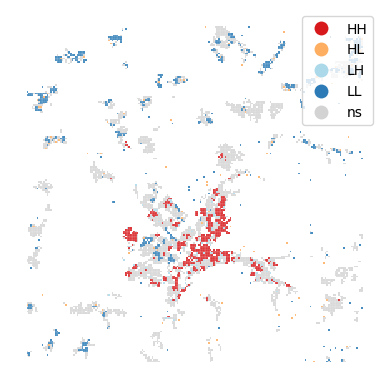

In [38]:
from splot.esda import lisa_cluster, moran_scatterplot

_ = lisa_cluster(lisa, gdf_01)

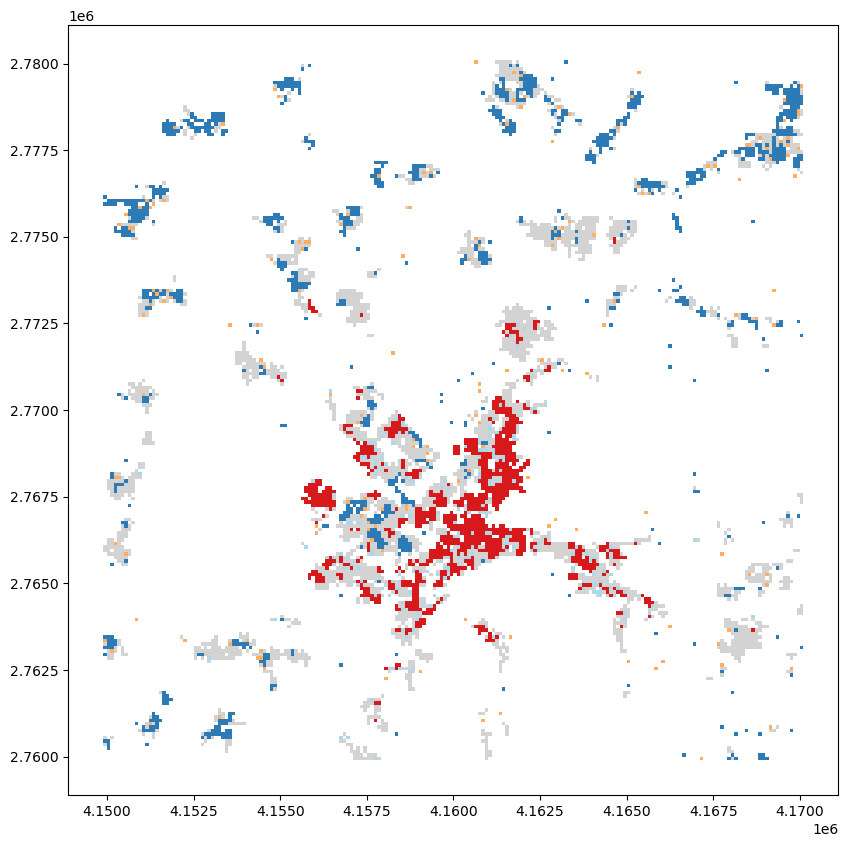

In [39]:
f, ax = plt.subplots(1, figsize=(10, 10))
gdf_01.loc[gdf_01["cluster"] == "Not significant"].plot(ax=ax, color="lightgrey")
gdf_01.loc[(gdf_01["cluster"] == "High-high")].plot(ax=ax, color="#d7191c")
gdf_01.loc[(gdf_01["cluster"] == "Low-low")].plot(ax=ax, color="#2c7bb6")
gdf_01.loc[(gdf_01["cluster"] == "Low-high")].plot(ax=ax, color="#abd9e9")
gdf_01.loc[(gdf_01["cluster"] == "High-low")].plot(ax=ax, color="#fdae61");

In [ ]:
gdf_01.explore("cluster", prefer_canvas=True, cmap=["#d7191c","#fdae61","#abd9e9","#2c7bb6","lightgrey"])

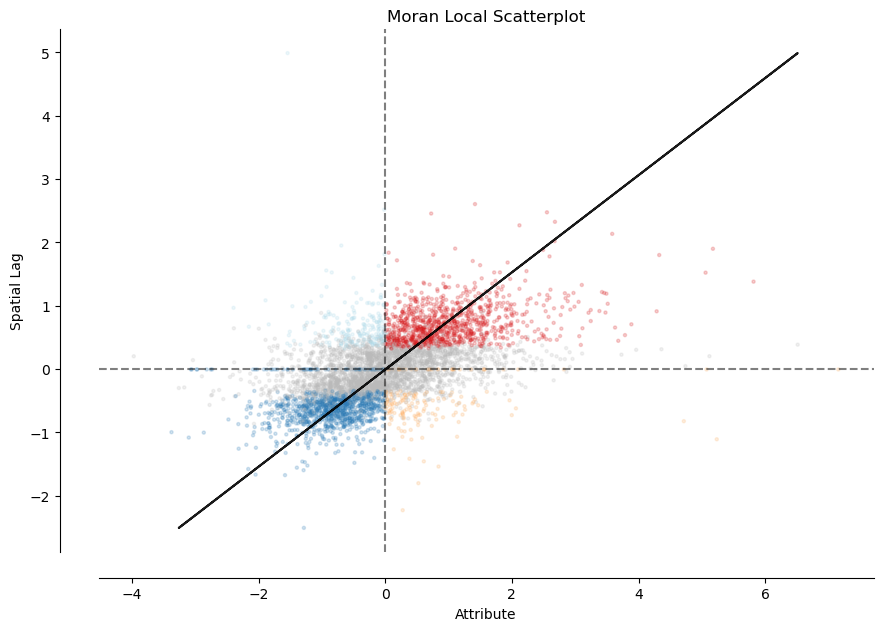

In [54]:
f, ax = plt.subplots(1, figsize=(10, 10))

moran_scatterplot(lisa, p=0.1, scatter_kwds={"s": 5, "alpha":.2},ax = ax)

plt.show()

## 0.05 Significance

In [42]:
gdf_005 = gdf.copy()

gdf_005.loc[lisa.p_sim < 0.05, 'cluster'] = lisa.q[lisa.p_sim < 0.05]
gdf_005["cluster"] = gdf_005["cluster"].fillna(0)
gdf_005["cluster"] = gdf_005["cluster"].map(
    {
        0: "Not significant",
        1: "High-high",
        2: "Low-high",
        3: "Low-low",
        4: "High-low",
    }
)
gdf_005.head()

,x_mp_100m,y_mp_100m,durchschnMieteQM,werterlaeuternde_Zeichen,geometry,lag,rent_std,rent_std_lag,cluster
GITTER_ID_100m,,,,,,,,,
CRS3035RES100mN2759900E4157100,4157150,2759950,9.60,None,"POLYGON ((4157200 2760000, 4157200 2759900, 41...",9.930,0.345884,0.512531,Not significant
CRS3035RES100mN2759900E4157200,4157250,2759950,8.70,None,"POLYGON ((4157300 2760000, 4157300 2759900, 41...",9.726,-0.108608,0.409513,Not significant
CRS3035RES100mN2759900E4157300,4157350,2759950,8.69,None,"POLYGON ((4157400 2760000, 4157400 2759900, 41...",9.855,-0.113658,0.474657,Not significant
CRS3035RES100mN2759900E4157400,4157450,2759950,9.56,None,"POLYGON ((4157500 2760000, 4157500 2759900, 41...",8.180,0.325685,-0.371204,Not significant
CRS3035RES100mN2759900E4157500,4157550,2759950,5.55,None,"POLYGON ((4157600 2760000, 4157600 2759900, 41...",9.895,-1.699332,0.494857,Not significant


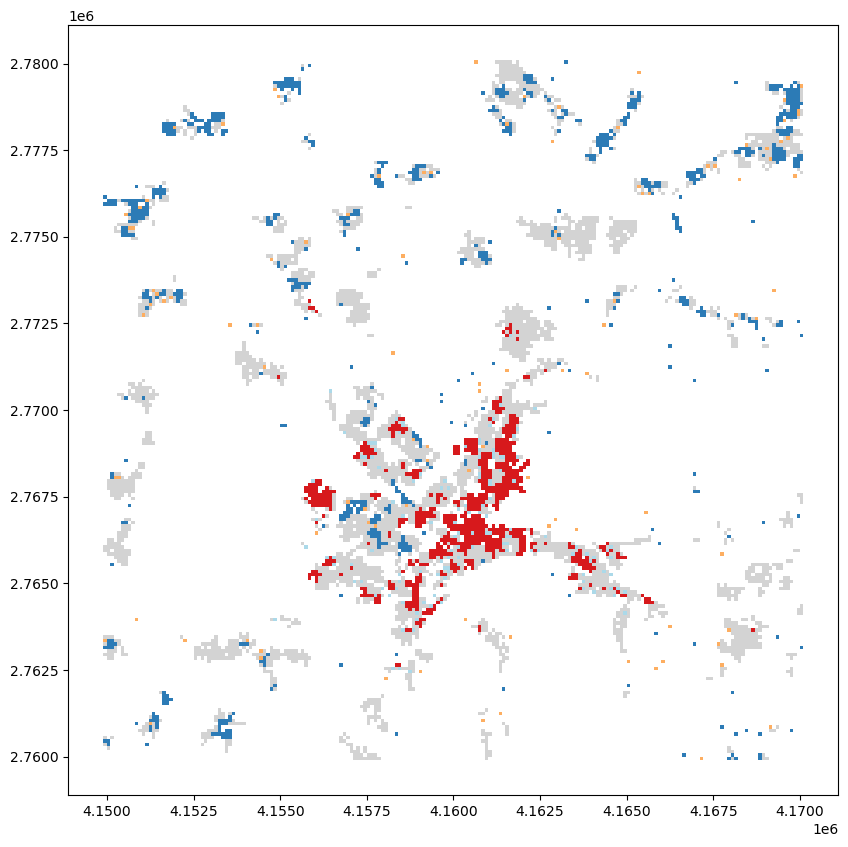

In [43]:
f, ax = plt.subplots(1, figsize=(10, 10))
gdf_005.loc[gdf_005["cluster"] == "Not significant"].plot(ax=ax, color="lightgrey")
gdf_005.loc[(gdf_005["cluster"] == "High-high")].plot(ax=ax, color="#d7191c")
gdf_005.loc[(gdf_005["cluster"] == "Low-low")].plot(ax=ax, color="#2c7bb6")
gdf_005.loc[(gdf_005["cluster"] == "Low-high")].plot(ax=ax, color="#abd9e9")
gdf_005.loc[(gdf_005["cluster"] == "High-low")].plot(ax=ax, color="#fdae61");

In [ ]:
gdf_005.explore("cluster", prefer_canvas=True, cmap=["#d7191c","#fdae61","#abd9e9","#2c7bb6","lightgrey"])

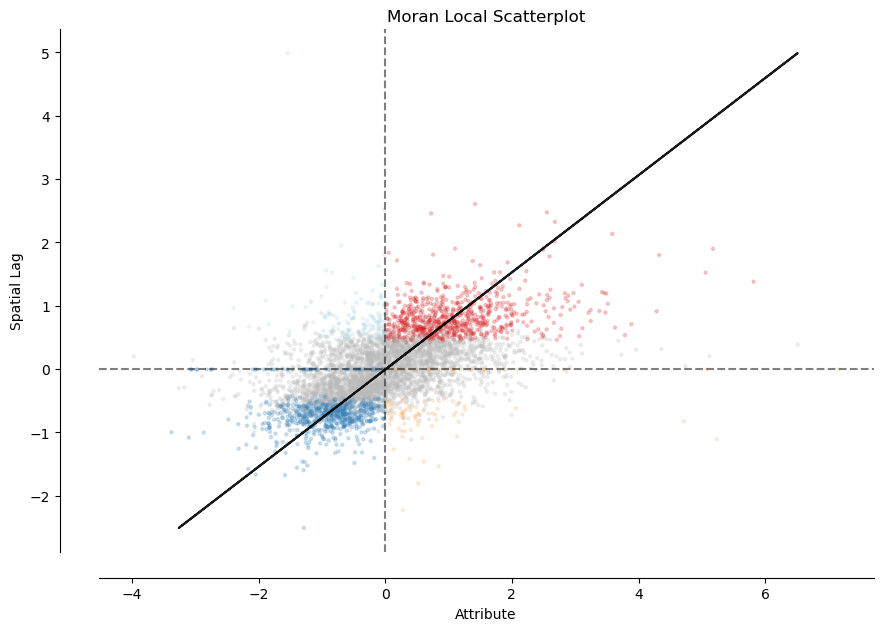

In [53]:
f, ax = plt.subplots(1, figsize=(10, 10))

moran_scatterplot(lisa, p=0.05, scatter_kwds={"s": 5, "alpha":.2},ax = ax)

plt.show()

## 0.01 Significance

In [46]:
gdf_001 = gdf.copy()

gdf_001.loc[lisa.p_sim < 0.01, 'cluster'] = lisa.q[lisa.p_sim < 0.01]
gdf_001["cluster"] = gdf_001["cluster"].fillna(0)
gdf_001["cluster"] = gdf_001["cluster"].map(
    {
        0: "Not significant",
        1: "High-high",
        2: "Low-high",
        3: "Low-low",
        4: "High-low",
    }
)
gdf_001.head()

,x_mp_100m,y_mp_100m,durchschnMieteQM,werterlaeuternde_Zeichen,geometry,lag,rent_std,rent_std_lag,cluster
GITTER_ID_100m,,,,,,,,,
CRS3035RES100mN2759900E4157100,4157150,2759950,9.60,None,"POLYGON ((4157200 2760000, 4157200 2759900, 41...",9.930,0.345884,0.512531,Not significant
CRS3035RES100mN2759900E4157200,4157250,2759950,8.70,None,"POLYGON ((4157300 2760000, 4157300 2759900, 41...",9.726,-0.108608,0.409513,Not significant
CRS3035RES100mN2759900E4157300,4157350,2759950,8.69,None,"POLYGON ((4157400 2760000, 4157400 2759900, 41...",9.855,-0.113658,0.474657,Not significant
CRS3035RES100mN2759900E4157400,4157450,2759950,9.56,None,"POLYGON ((4157500 2760000, 4157500 2759900, 41...",8.180,0.325685,-0.371204,Not significant
CRS3035RES100mN2759900E4157500,4157550,2759950,5.55,None,"POLYGON ((4157600 2760000, 4157600 2759900, 41...",9.895,-1.699332,0.494857,Not significant


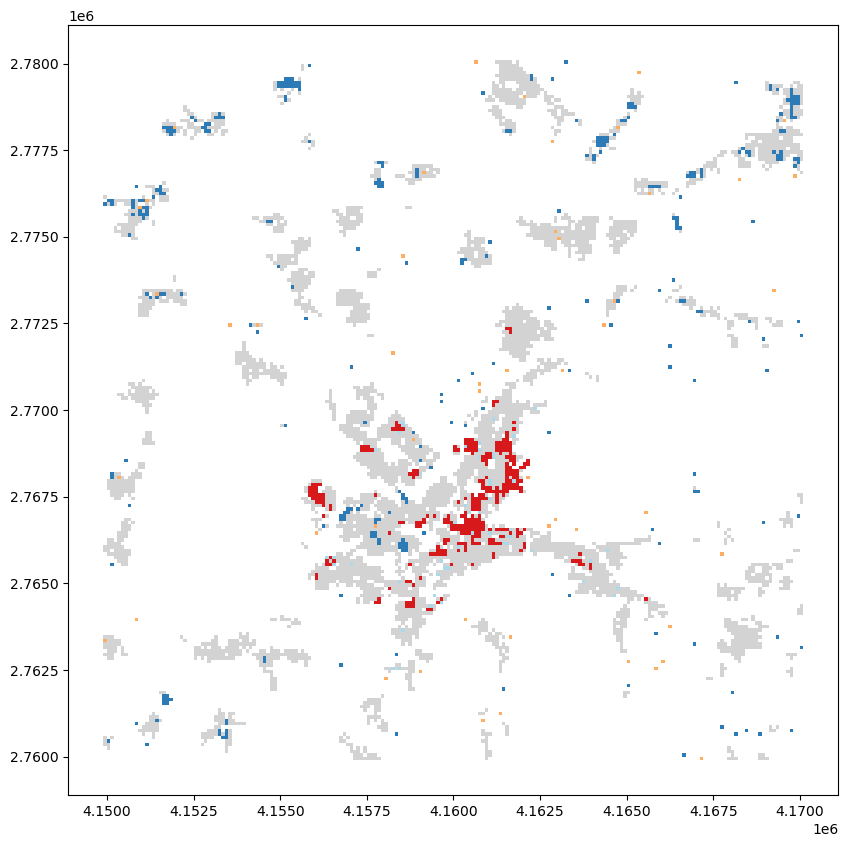

In [47]:
f, ax = plt.subplots(1, figsize=(10, 10))
gdf_001.loc[gdf_001["cluster"] == "Not significant"].plot(ax=ax, color="lightgrey")
gdf_001.loc[(gdf_001["cluster"] == "High-high")].plot(ax=ax, color="#d7191c")
gdf_001.loc[(gdf_001["cluster"] == "Low-low")].plot(ax=ax, color="#2c7bb6")
gdf_001.loc[(gdf_001["cluster"] == "Low-high")].plot(ax=ax, color="#abd9e9")
gdf_001.loc[(gdf_001["cluster"] == "High-low")].plot(ax=ax, color="#fdae61");

In [ ]:
gdf_001.explore("cluster", prefer_canvas=True, cmap=["#d7191c","#fdae61","#abd9e9","#2c7bb6","lightgrey"])

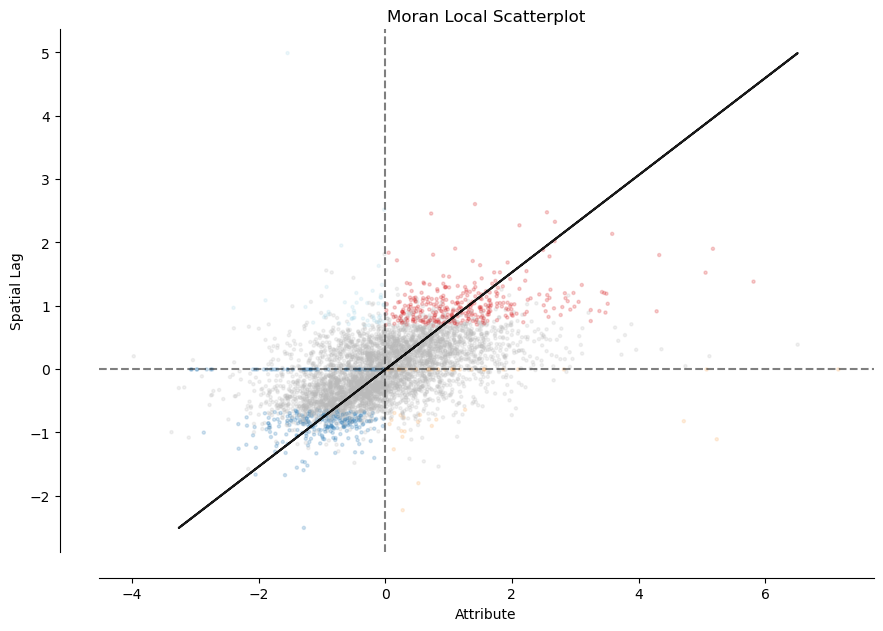

In [52]:
f, ax = plt.subplots(1, figsize=(10, 10))

moran_scatterplot(lisa, p=0.01, scatter_kwds={"s": 5, "alpha":.2},ax = ax)

plt.show()

In [50]:
import folium

In [51]:
m = gdf_001.explore("cluster", prefer_canvas=True, cmap=["#d7191c","#fdae61","#abd9e9","#2c7bb6","lightgrey"],style_kwds={'fillOpacity': 0.3, 'weight': 0}, name = "0.01")

gdf_005.explore("cluster", prefer_canvas=True, cmap=["#d7191c","#fdae61","#abd9e9","#2c7bb6","lightgrey"],style_kwds={'fillOpacity': 0.3, 'weight': 0}, name = "0.05",m=m)

gdf_01.explore("cluster", prefer_canvas=True, cmap=["#d7191c","#fdae61","#abd9e9","#2c7bb6","lightgrey"],style_kwds={'fillOpacity': 0.3, 'weight': 0}, name = "0.1",m=m)

# Add a layer control to toggle the layers on and off
folium.LayerControl().add_to(m)

# Display the map
m